In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
data = pd.read_csv("Bodyfat1.csv", sep=";")
data.head()

,bodyfat,Weight,Neck,Abdomen,Hip,Thigh,Knee,Ankle,Biceps,Forearm,Wrist
0,12.3,154.25,36.2,85.2,94.5,59.0,37.3,21.9,32.0,27.4,17.1
1,6.1,173.25,38.5,83.0,98.7,58.7,37.3,23.4,30.5,28.9,18.2
2,25.3,154.00,34.0,87.9,99.2,59.6,38.9,24.0,28.8,25.2,16.6
3,10.4,184.75,37.4,86.4,101.2,60.1,37.3,22.8,32.4,29.4,18.2
4,28.7,184.25,34.4,100.0,101.9,63.2,42.2,24.0,32.2,27.7,17.7


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 252 entries, 0 to 251
Data columns (total 11 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   bodyfat  252 non-null    float64
 1   Weight   252 non-null    float64
 2   Neck     252 non-null    float64
 3   Abdomen  252 non-null    float64
 4   Hip      252 non-null    float64
 5   Thigh    252 non-null    float64
 6   Knee     252 non-null    float64
 7   Ankle    252 non-null    float64
 8   Biceps   252 non-null    float64
 9   Forearm  252 non-null    float64
 10  Wrist    252 non-null    float64
dtypes: float64(11)
memory usage: 21.8 KB


In [ ]:
data.describe().style.background_gradient(axis=1,cmap=sns.light_palette('gold', as_cmap=True))

,bodyfat,Weight,Neck,Abdomen,Hip,Thigh,Knee,Ankle,Biceps,Forearm,Wrist
count,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000
mean,19.150794,178.924405,37.992063,92.555952,99.904762,59.405952,38.590476,23.102381,32.273413,28.663889,18.229762
std,8.368740,29.389160,2.430913,10.783077,7.164058,5.249952,2.411805,1.694893,3.021274,2.020691,0.933585
min,0.000000,118.500000,31.100000,69.400000,85.000000,47.200000,33.000000,19.100000,24.800000,21.000000,15.800000
25%,12.475000,159.000000,36.400000,84.575000,95.500000,56.000000,36.975000,22.000000,30.200000,27.300000,17.600000
50%,19.200000,176.500000,38.000000,90.950000,99.300000,59.000000,38.500000,22.800000,32.050000,28.700000,18.300000
75%,25.300000,197.000000,39.425000,99.325000,103.525000,62.350000,39.925000,24.000000,34.325000,30.000000,18.800000
max,47.500000,363.150000,51.200000,148.100000,147.700000,87.300000,49.100000,33.900000,45.000000,34.900000,21.400000


In [ ]:
num = ['bodyfat', 'Weight', 'Neck', 'Abdomen', 'Hip', 'Thigh', 'Knee', 'Ankle',
       'Biceps', 'Forearm', 'Wrist']

In [ ]:
data.columns

Index(['bodyfat', 'Weight', 'Neck', 'Abdomen', 'Hip', 'Thigh', 'Knee', 'Ankle',
       'Biceps', 'Forearm', 'Wrist'],
      dtype='object')

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1319: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1319: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Ver

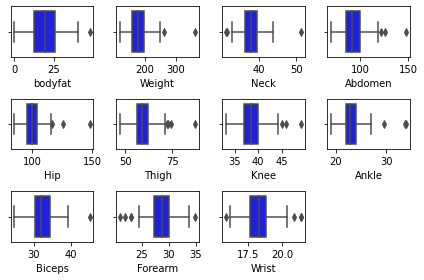

In [ ]:
for i in range(0, len(num)):
    plt.subplot(3, 4, i+1)
    sns.boxplot(data[num[i]], color='blue', orient='v')
    plt.tight_layout()

In [ ]:
print(data.duplicated().sum())
data.drop_duplicates(inplace=True)
print(data.duplicated().sum())

0
0


In [ ]:
print(f'Jumlah baris sebelum memfilter outlier: {len(data)}')

## CODE HERE
filtered_entries = np.array([False] * len(data))
for col in data[['bodyfat', 'Weight', 'Neck', 'Abdomen',
                'Hip', 'Thigh', 'Knee', 'Ankle','Biceps', 'Forearm', 'Wrist']]:
                Q1 = data[col].quantile(0.25)
                Q3 = data[col].quantile(0.75)
                IQR = Q3 - Q1
                low_limit = Q1 - (IQR * 1.5)
                high_limit = Q3 + (IQR * 1.5)

                filtered_entries = ((data[col] < low_limit) | (data[col] > high_limit)) | filtered_entries
    
data2 = data[~filtered_entries]
print(f'Jumlah baris setelah memfilter outlier: {len(data2)}')

Jumlah baris sebelum memfilter outlier: 252
Jumlah baris setelah memfilter outlier: 235


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1319: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_core.py:1319: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Ver

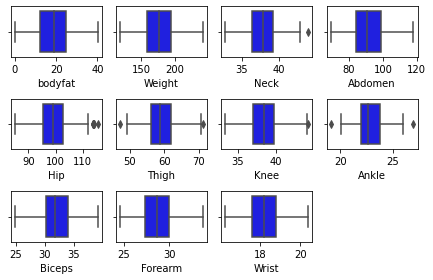

In [ ]:
for i in range(0, len(num)):
    plt.subplot(3, 4, i+1)
    sns.boxplot(data2[num[i]], color='blue', orient='v')
    plt.tight_layout()

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

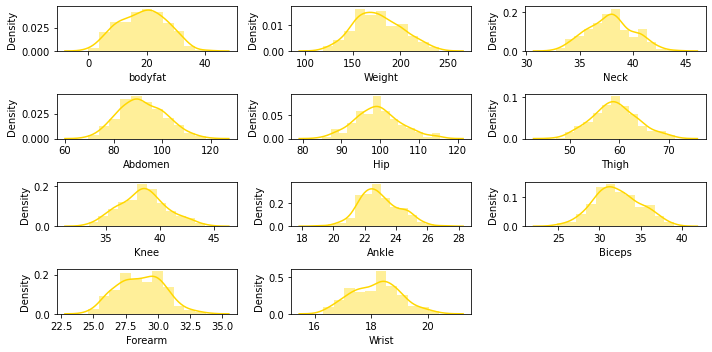

In [ ]:
plt.figure(figsize=(10, 5))
for i in range(0, len(num)):
    plt.subplot(4,3, i+1)
    sns.distplot(data2[num[i]], color='gold')
    plt.tight_layout()

In [ ]:
from sklearn import preprocessing
names = data2.columns
# make a copy of the numerical data
df_to_norm = data2[['bodyfat', 'Weight', 'Neck', 'Abdomen', 'Hip', 'Thigh', 'Knee', 'Ankle',
       'Biceps', 'Forearm', 'Wrist']]
# store the column names
names = df_to_norm.columns

# create the normaliser
normaliser = preprocessing.Normalizer(norm = 'l1')

# fit the data into the normaliser
df_normed = normaliser.fit_transform(df_to_norm)

# transform df_normed to a pandas DataFrame
df_normed = pd.DataFrame(df_normed, columns = names)

# print the dfs head to see if all looks good
df_normed.head()

,bodyfat,Weight,Neck,Abdomen,Hip,Thigh,Knee,Ankle,Biceps,Forearm,Wrist
0,0.021312,0.267262,0.062722,0.147622,0.163736,0.102226,0.064628,0.037945,0.055445,0.047475,0.029628
1,0.010225,0.290420,0.064538,0.139133,0.165451,0.098399,0.062526,0.039226,0.051127,0.048445,0.030509
2,0.042628,0.259478,0.057287,0.148104,0.167144,0.100421,0.065543,0.040438,0.048526,0.042460,0.027970
3,0.016765,0.297816,0.060289,0.139276,0.163134,0.096881,0.060127,0.036753,0.052229,0.047393,0.029338
4,0.043733,0.280762,0.052419,0.152381,0.155276,0.096305,0.064305,0.036571,0.049067,0.042210,0.026971


In [ ]:
!pip install pywedge

     |████████████████████████████████| 69.2MB 48kB/s 


In [ ]:
import pywedge as pw
dash = pw.Pywedge_Charts(data2, c=None, y='bodyfat')
dashboard = dash.make_charts()

HTML(value='<h2>Pywedge Make_Charts </h2>')

In [ ]:
!pip3 install pandas_profiling --upgrade

     |████████████████████████████████| 256kB 25.5MB/s 
     |████████████████████████████████| 3.1MB 39.9MB/s 
     |████████████████████████████████| 81kB 10.3MB/s 
     |████████████████████████████████| 10.1MB 22.5MB/s 
     |████████████████████████████████| 645kB 46.6MB/s 
     |████████████████████████████████| 61kB 9.6MB/s 
     |████████████████████████████████| 112kB 60.3MB/s 
     |████████████████████████████████| 1.1MB 53.8MB/s 
     |████████████████████████████████| 296kB 48.6MB/s 
  Created wheel for htmlmin: filename=htmlmin-0.1.12-cp37-none-any.whl size=27099 sha256=fabf407d35b48355a2539251c37584d9b334a3bfb4ab29098501fdd439b0cc0c
  Stored in directory: /root/.cache/pip/wheels/43/07/ac/7c5a9d708d65247ac1f94066cf1db075540b85716c30255459
  Created wheel for phik: filename=phik-0.11.2-cp37-none-any.whl size=1107437 sha256=af7f5269e6f389910a62670066d014aa2d7a3bc2214af80230ce877327e16ac6
  Stored in directory: /root/.cache/pip/wheels/c0/a3/b0/f27b1cfe32ea131a3715169132ff6d8

In [ ]:
import pandas_profiling as pp
from pandas_profiling import ProfileReport
pp.ProfileReport(data2)

Summarize dataset:   0%|          | 0/25 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<Figure size 1080x1080 with 0 Axes>

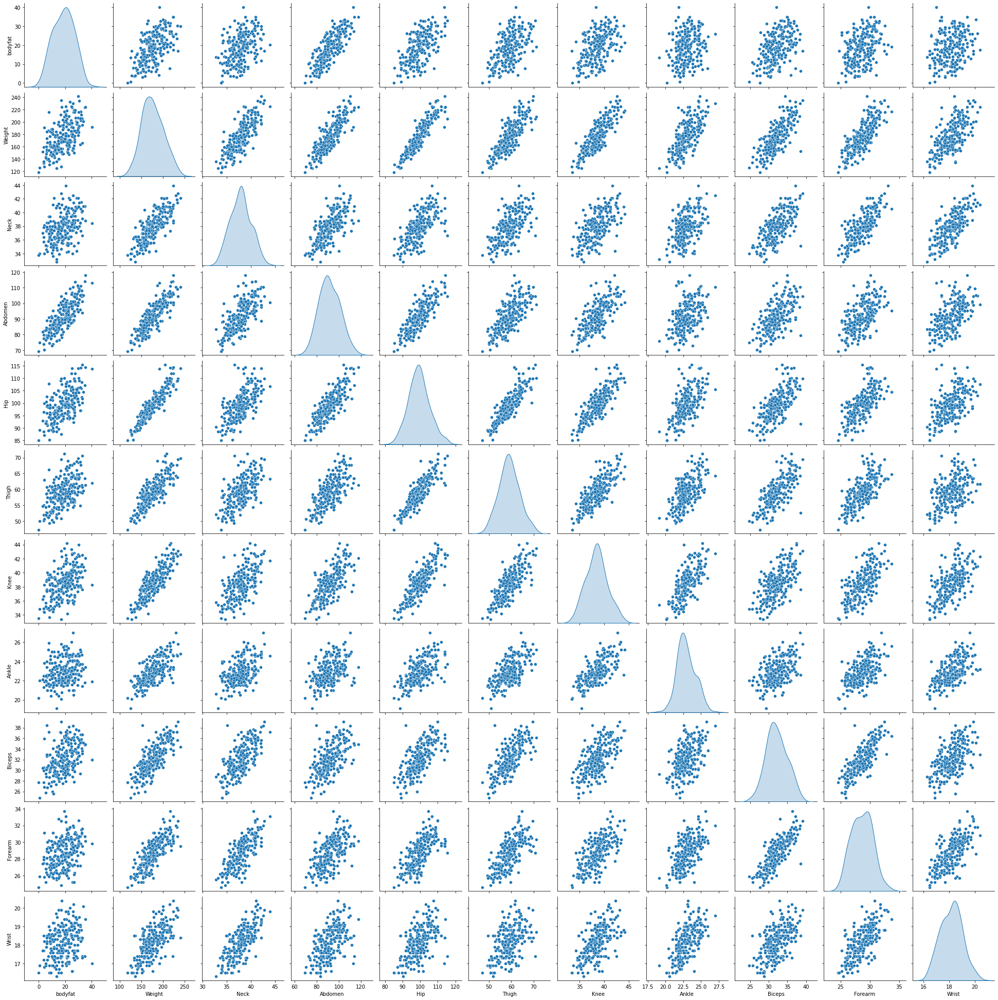

In [ ]:
plt.figure(figsize=(15, 15))
sns.pairplot(data2, diag_kind='kde')

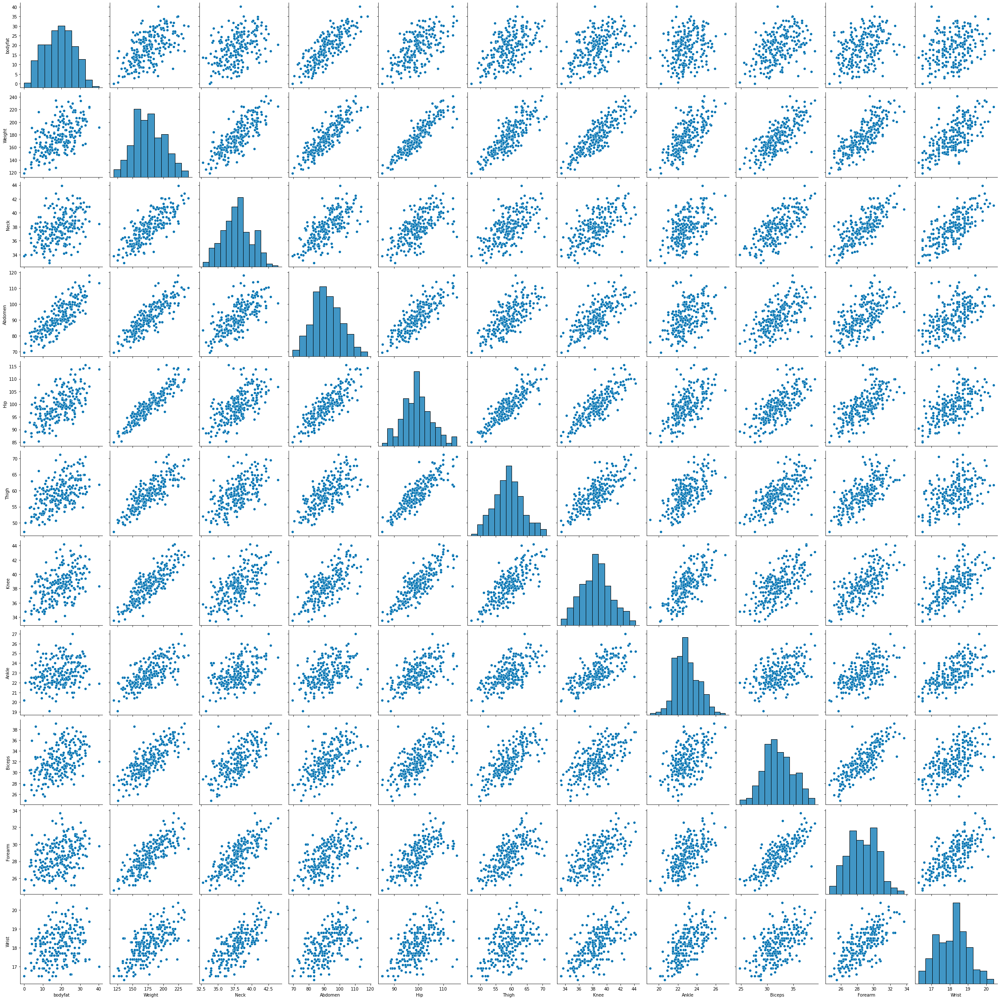

In [ ]:
# Visualize the data using scatter plot and histogram
sns.set_palette('colorblind')
sns.pairplot(data=data2, height=3)

In [ ]:
import warnings
## Building Model
from sklearn import linear_model
# Set independent and dependent variables
X = data2[['Weight', 'Neck', 'Abdomen', 'Hip', 'Thigh', 'Knee', 'Ankle',
       'Biceps', 'Forearm', 'Wrist']]
y = data2['bodyfat']

# Initialize model from sklearn and fit it into our data
regr = linear_model.LinearRegression()
model = regr.fit(X, y)

print('Intercept:', model.intercept_)
print('Coefficients:', model.coef_)

Intercept: -24.509532587558038
Coefficients: [-0.10390672 -0.34869048  0.98268995 -0.15658416  0.23934306  0.01385197
 -0.1600133   0.17094103  0.23041961 -1.2626139 ]


In [ ]:
from scipy import stats
import statsmodels
import statsmodels.api as sm
X = data2[['Weight', 'Neck', 'Abdomen', 'Hip', 'Thigh', 'Knee', 'Ankle',
       'Biceps', 'Forearm', 'Wrist']]
X = sm.add_constant(X) # adding a constant
olsmod = sm.OLS(data2['bodyfat'], X).fit()
print(olsmod.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning:

pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.



                            OLS Regression Results                            
Dep. Variable:                bodyfat   R-squared:                       0.716
Model:                            OLS   Adj. R-squared:                  0.704
Method:                 Least Squares   F-statistic:                     56.56
Date:                Fri, 25 Jun 2021   Prob (F-statistic):           9.99e-56
Time:                        12:45:14   Log-Likelihood:                -671.80
No. Observations:                 235   AIC:                             1366.
Df Residuals:                     224   BIC:                             1404.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -24.5095     13.999     -1.751      0.0

In [ ]:
print('R2 score:', olsmod.rsquared)

R2 score: 0.7163111877170197


In [ ]:
print('F-statistic:', olsmod.fvalue)#uji anova
print('Probability of observing value at least as high as F-statistic:', olsmod.f_pvalue)

F-statistic: 56.55975812276991
Probability of observing value at least as high as F-statistic: 9.994737660722577e-56


In [ ]:
print(olsmod.pvalues)#uji t

const      8.134825e-02
Weight     2.418522e-02
Neck       1.873640e-01
Abdomen    5.889645e-35
Hip        3.082509e-01
Thigh      9.629522e-02
Knee       9.598779e-01
Ankle      6.642779e-01
Biceps     3.662646e-01
Forearm    5.081758e-01
Wrist      2.762003e-02
dtype: float64


In [ ]:
from scipy import stats
import statsmodels
import statsmodels.api as sm
X = data2[['Weight','Abdomen','Wrist']]
X = sm.add_constant(X) # adding a constant
olsmod1 = sm.OLS(data2['bodyfat'], X).fit()
print(olsmod1.summary())

                            OLS Regression Results                            
Dep. Variable:                bodyfat   R-squared:                       0.706
Model:                            OLS   Adj. R-squared:                  0.702
Method:                 Least Squares   F-statistic:                     185.1
Date:                Fri, 25 Jun 2021   Prob (F-statistic):           3.75e-61
Time:                        12:56:50   Log-Likelihood:                -675.93
No. Observations:                 235   AIC:                             1360.
Df Residuals:                     231   BIC:                             1374.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -25.6705      7.289     -3.522      0.0

In [ ]:
#pengujian asumsi
data2['bodyfat_pred'] = olsmod.predict(X)
X['residual'] = olsmod.resid
X.head()#residual 

,const,Weight,Abdomen,Wrist,residual
0,1.0,154.25,85.2,17.1,-3.714494
1,1.0,173.25,83.0,18.2,-4.559731
2,1.0,154.00,87.9,16.6,5.950762
3,1.0,184.75,86.4,18.2,-2.506551
4,1.0,184.25,100.0,17.7,2.120962


/usr/local/lib/python3.7/dist-packages/seaborn/regression.py:580: UserWarning:

The `size` parameter has been renamed to `height`; please update your code.



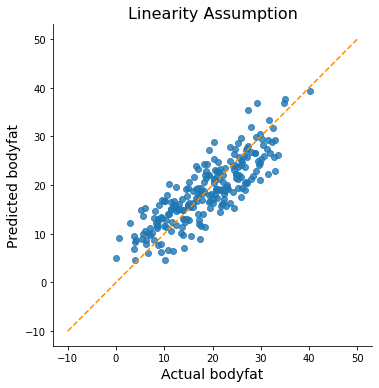

In [ ]:
# Plotting the observed vs predicted values
sns.lmplot(x='bodyfat', y='bodyfat_pred', data=data2, fit_reg=False, size=5)
    
# Plotting the diagonal line
line_coords = np.arange(data2[['bodyfat', 'bodyfat_pred']].min().min()-10, 
                        data2[['bodyfat', 'bodyfat_pred']].max().max()+10)
plt.plot(line_coords, line_coords,  # X and y points
         color='darkorange', linestyle='--')

plt.ylabel('Predicted bodyfat', fontsize=14)
plt.xlabel('Actual bodyfat', fontsize=14)
plt.title('Linearity Assumption', fontsize=16)
plt.show()#uji asumsi linear

p-value from the test Anderson-Darling test below 0.05 generally means non-normal: 0.13586521162675033


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



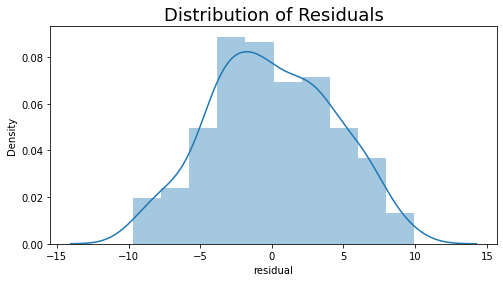

Residuals are normally distributed


In [ ]:
#uji asumsi normalitas
from statsmodels.stats.diagnostic import normal_ad

# Performing the test on the residuals
p_value = normal_ad(data2['residual'])[1]
print('p-value from the test Anderson-Darling test below 0.05 generally means non-normal:', p_value)

# Plotting the residuals distribution
plt.subplots(figsize=(8, 4))
plt.title('Distribution of Residuals', fontsize=18)
sns.distplot(data2['residual'])
plt.show()

# Reporting the normality of the residuals
if p_value < 0.05:
    print('Residuals are not normally distributed')
else:
    print('Residuals are normally distributed')

Pearson correlation coefficient matrix of each variables:
           bodyfat    Weight   Abdomen     Wrist
bodyfat  1.000000  0.583979  0.806771  0.257884
Weight   0.583979  1.000000  0.854703  0.670950
Abdomen  0.806771  0.854703  1.000000  0.532391
Wrist    0.257884  0.670950  0.532391  1.000000


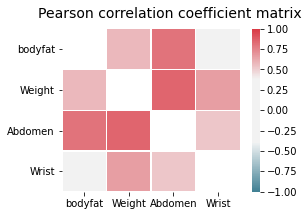

In [ ]:
#uji multiko
corr = data2[['bodyfat','Weight', 'Abdomen','Wrist']].corr()
print('Pearson correlation coefficient matrix of each variables:\n', corr)

# Generate a mask for the diagonal cell
mask = np.zeros_like(corr, dtype=np.bool)
np.fill_diagonal(mask, val=True)

# Initialize matplotlib figure
fig, ax = plt.subplots(figsize=(4, 3))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True, sep=100)
cmap.set_bad('white')

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmin=-1, vmax=1, center=0, linewidths=.5)
fig.suptitle('Pearson correlation coefficient matrix', fontsize=14)
ax.tick_params(axis='both', which='major', labelsize=10)
# fig.tight_layout()

In [ ]:
#autokorelasi
from statsmodels.stats.stattools import durbin_watson
durbinWatson = durbin_watson(data2['residual'])

print('Durbin-Watson:', durbinWatson)
if durbinWatson < 1.5:
    print('Signs of positive autocorrelation', '\n')
    print('Assumption not satisfied')
elif durbinWatson > 2.5:
    print('Signs of negative autocorrelation', '\n')
    print('Assumption not satisfied')
else:
    print('Little to no autocorrelation', '\n')
    print('Assumption satisfied')

Durbin-Watson: 1.7243479814425966
Little to no autocorrelation 

Assumption satisfied


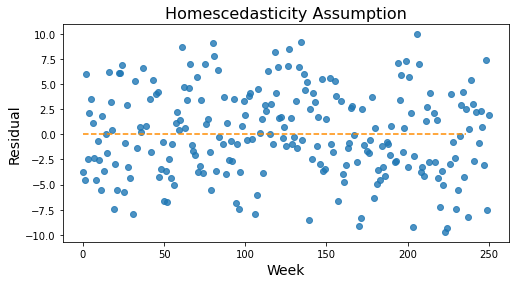

In [ ]:
# Plotting the residuals
plt.subplots(figsize=(8, 4))
plt.scatter(x=data2.index, y=data2.residual, alpha=0.8)
plt.plot(np.repeat(0, len(data2.index)+2), color='darkorange', linestyle='--')

plt.ylabel('Residual', fontsize=14)
plt.xlabel('Week', fontsize=14)
plt.title('Homescedasticity Assumption', fontsize=16)
plt.show()

In [ ]:
X1 = data2[['Weight','Abdomen','Wrist']]
y1 = data2['bodyfat']
#Splitting the data into Train and Test
from sklearn.model_selection import train_test_split
Xtrain, Xtest, ytrain, ytest = train_test_split(X1,y1,test_size=0.2, random_state=75)

In [ ]:
from sklearn.linear_model import ElasticNet
elasticnet_model = ElasticNet(alpha=1.0, max_iter=2000, l1_ratio=0.8)
elasticnet_model.fit(Xtrain, ytrain)

ElasticNet(alpha=1.0, copy_X=True, fit_intercept=True, l1_ratio=0.8,
           max_iter=2000, normalize=False, positive=False, precompute=False,
           random_state=None, selection='cyclic', tol=0.0001, warm_start=False)

In [ ]:
#Predicting elasticnet
pred = elasticnet_model.predict(Xtest)

In [ ]:
from sklearn import metrics
from sklearn.metrics import mean_squared_error, mean_absolute_error, confusion_matrix
# The coefficients
print('Coefficients: \n', elasticnet_model.coef_)#untuk linear regresi model
# The Intercept
print('Intercept: \n', elasticnet_model.intercept_)#untuk linear model regresi

print('tabel error linear regression : ')
print('Mean Absolute Error           : ', metrics.mean_absolute_error(ytest, pred))
print('Mean Squared  Error           : ', metrics.mean_squared_error(ytest, pred))
print('Root Mean Squared  Error      : ', np.sqrt(metrics.mean_squared_error(ytest, pred)))
print('R Squared Error               : ', metrics.r2_score(ytest, pred))
# Explained variance score: 1 is perfect prediction
from sklearn.metrics import r2_score

Coefficients: 
 [-0.10912586  0.91423043 -0.        ]
Intercept: 
 -45.81437491145459
tabel error linear regression : 
Mean Absolute Error           :  4.147927473829421
Mean Squared  Error           :  22.551020012076904
Root Mean Squared  Error      :  4.748791426465991
R Squared Error               :  0.6621009737972269


In [ ]:
X.to_excel("data_baru.xlsx", index = False)